# Projeto Zomato
___

# Preparação dos dados

In [1]:
# Importando pacotes necessários:

import pandas as pd
import inflection
import plotly.express as px
import folium
from folium.plugins import MarkerCluster
from streamlit_folium import folium_static
from haversine import haversine # Para calcular distâncias a partir de latitudes e longitudes

In [2]:
# Lendo o arquivo:

df_original = pd.read_csv('dataset/zomato.csv')

In [3]:
# Criando uma cópia do dataframe:

df = df_original.copy()

## Funções auxiliares

In [4]:
# Renomear as colunas do dataframe:

def rename_columns(dataframe):
    df = dataframe.copy()
    title = lambda x: inflection.titleize(x)
    snakecase = lambda x: inflection.underscore(x)
    spaces = lambda x: x.replace(" ", "")
    cols_old = list(df.columns)
    cols_old = list(map(title, cols_old))
    cols_old = list(map(spaces, cols_old))
    cols_new = list(map(snakecase, cols_old))
    df.columns = cols_new
    
    return df

In [5]:
# Preenchimento do nome dos países:

COUNTRIES = {
    1: "India",
    14: "Australia",
    30: "Brazil",
    37: "Canada",
    94: "Indonesia",
    148: "New Zeland",
    162: "Philippines",
    166: "Qatar",
    184: "Singapure",
    189: "South Africa",
    191: "Sri Lanka",
    208: "Turkey",
    214: "United Arab Emirates",
    215: "United Kingdom",
    216: "United States of America",
}

def country_name(country_id):
    return COUNTRIES[country_id]

In [6]:
# Criação da categoria do tipo de comida:

def create_price_type(price_range):
    if price_range == 1:
        return "cheap"
    elif price_range == 2:
        return "normal"
    elif price_range == 3:
        return "expensive"
    else:
        return "gourmet"

In [7]:
#Criação do nome das cores:

COLORS = {
    "3F7E00": "darkgreen",
    "5BA829": "green",
    "9ACD32": "lightgreen",
    "CDD614": "orange",
    "FFBA00": "red",
    "CBCBC8": "darkred",
    "FF7800": "darkred",
}

def color_name(color_code):
    return COLORS[color_code]

In [8]:
# Ajustando a ordem das colunas:

def adjust_columns_order(dataframe):
    df = dataframe.copy()

    new_cols_order = [
        "restaurant_id",
        "restaurant_name",
        "country",
        "city",
        "address",
        "locality",
        "locality_verbose",
        "longitude",
        "latitude",
        "cuisines",
        "price_range",
        "price_type",
        "average_cost_for_two",
        "currency",
        "has_table_booking",
        "has_online_delivery",
        "is_delivering_now",
        "aggregate_rating",
        "rating_color",
        "color_name",
        "rating_text",
        "votes",
    ]

    return df.loc[:, new_cols_order]

## Limpeza e organização dos dados:

In [9]:
# Eliminando NaN:
df = df.dropna()

# Renomear as colunas do dataframe:

df = rename_columns(df)

# Remoção da coluna "switch_to_order_menu" - possui apenas um valor em todas as linhas:

df = df.drop(columns = ['switch_to_order_menu'])

# Remoção das culunas "address", "locality", "locality_verbose" - informações repetidas e não serão usadas

# df = df.drop( columns = ['address', 'locality', 'locality_verbose'] )

# Criação de uma coluna com o nome dos países e remoção da coluna 'country_code':

df['country'] = df.loc[:, 'country_code'].apply(lambda x: country_name(x))

df = df.drop(columns=['country_code'])

# Criação de uma coluna da categoria do tipo de comida e remoção da coluna 'price_range':

df['price_type'] = df.loc[:, 'price_range'].apply(lambda x: create_price_type(x))

#df = df.drop( columns = ['price_range'] )

# Criação de uma coluna com o nome das cores:

df['color_name'] = df.loc[:, 'rating_color'].apply(lambda x: color_name(x))

# Categorização dos restaurantes por somente um tipo de culinária:

df['cuisines'] = df.loc[:, 'cuisines'].apply(lambda x: x.split(',')[0])

# Eliminando linhas duplicadas:

df = df.drop_duplicates()

# Ajustando a ordem das colunas:

df = adjust_columns_order(df)


## Entendimento dos dados:

In [10]:
# Estatística descritiva:

entendimento_dados_dic = {
    "average_cost_for_two_mean": df['average_cost_for_two'].mean(),
    "average_cost_for_two_std": df['average_cost_for_two'].std(),
    "average_cost_for_two_min": df['average_cost_for_two'].min(),
    "average_cost_for_two_max": df['average_cost_for_two'].max(),
    "aggregate_rating_mean": df['aggregate_rating'].mean(),
    "aggregate_rating_std": df['aggregate_rating'].std(),
    "aggregate_rating_min": df['aggregate_rating'].min(),
    "aggregate_rating_max": df['aggregate_rating'].max(),
    "votes_mean": df['votes'].mean(),
    "votes_std": df['votes'].std(),
    "votes_min": df['votes'].min(),
    "votes_max": df['votes'].max()
}

entendimento_dados = pd.DataFrame(entendimento_dados_dic, index=[0])

entendimento_dados

# Os dados referentes ao custo médio para duas pessoas apresentam outliers que devem ser removidos.

,average_cost_for_two_mean,average_cost_for_two_std,average_cost_for_two_min,average_cost_for_two_max,aggregate_rating_mean,aggregate_rating_std,aggregate_rating_min,aggregate_rating_max,votes_mean,votes_std,votes_min,votes_max
0,7520.077212,302534.779121,0,25000017,4.131116,0.662287,0.0,4.9,605.359071,1116.539143,0,41333


In [11]:
# Verificação do outlier:

average_cost_dollar = df.loc[df['currency'] == 'Dollar($)', ['average_cost_for_two', 'currency']].reset_index(drop=True)

average_cost_dollar.sort_values('average_cost_for_two', ascending=False)

# O valor de 25000017 é incompatível para a moeda dólar -> remover

,average_cost_for_two,currency
36,25000017,Dollar($)
1749,755,Dollar($)
1098,650,Dollar($)
446,600,Dollar($)
1080,600,Dollar($)
...,...,...
735,0,Dollar($)
1233,0,Dollar($)
732,0,Dollar($)
233,0,Dollar($)


In [12]:
# Removendo outliers:

df = df.loc[df['average_cost_for_two'] != 25000017, :]

# Resetando o index:
df = df.reset_index( drop = True )

In [13]:
# Salvando dados tratados em um arquivo .csv:

df.to_csv('dados_tratados.csv', index=False, sep=';')

# Análise dos dados:

## Visão Geral

### 1. Quantos restaurantes únicos estão registrados?

In [14]:
# Como os valores repetidos de restaurant_id foram eliminados na limpeza dos dados, posso usar .count ou .nunique que retornará o mesmo valor,
# pois todos os valores de id são únicos após a limpeza.

df['restaurant_id'].nunique()

6928

### 2. Quantos países únicos estão registrados?

In [15]:
df['country'].nunique()

15

### 3. Quantas cidades únicas estão registradas?

In [16]:
df['city'].nunique()

125

### 4. Qual o total de avaliações feitas?

In [17]:
# O total de avaliações feitas é a soma dos valores da coluna 'votes'.

df['votes'].sum()

4194330

### 5. Qual o total de tipos de culinária registrados?

In [18]:
df['cuisines'].nunique()

165

### Mapa

In [19]:
df_aux = df.loc[:, ['latitude', 'longitude', 'restaurant_name', 'cuisines', 'average_cost_for_two', 'currency','aggregate_rating', 'color_name']]


map = folium.Map() # Cria o mapa:

marker_cluster = MarkerCluster().add_to(map) # Cria a layer dos marcadores clusterizados

# O comando .Marker coloca pontos (pinos) no mapa
# folium.Marker([latitude, longitude]).add_to(map) coloca apenas o primeiro pino no mapa, 
# então preciso fazer um loop for para percorrer a lista e colocar os outros pinos.

for index, info in df_aux.iterrows(): # .iterrows() transforma as linhas em um objeto de iteração.

    
    popup = folium.Popup(f""" <p><strong>{info['restaurant_name']}</strong></p>
    Preço: {info['average_cost_for_two']},00 {info['currency']} para dois<br>
    Cuisine: {info['cuisines']}<br>
    Aggregate rating: {info['aggregate_rating']}/5.0 
           """,
        max_width=500,
    )
    
    folium.Marker(location=[info['latitude'], info['longitude']],
                icon=folium.Icon(icon='glyphicon glyphicon-cutlery', color=info['color_name']),
                popup=popup).add_to(marker_cluster)

map

## Visão País

### 1. Qual o nome do país que possui mais cidades registradas?

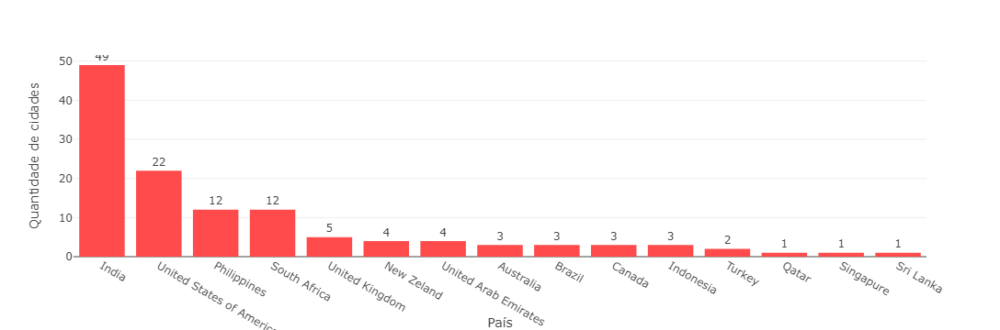

In [20]:
# Encontrar o número de cidades registradas por país.

df_aux = (df.loc[:, ['country','city']].groupby('country')
                                        .nunique()
                                        .sort_values('city', ascending=False)
                                        .reset_index())



fig = px.bar(df_aux, x='country', y ='city', text='city', category_orders={'city': df_aux['city']}, 
       labels={'country': 'País',
        'city': 'Quantidade de cidades'})

fig.update_traces(marker_color='#ff4b4b', textposition='outside')
fig.update_layout(height=550)


### 2. Qual o nome do país que possui mais restaurantes registrados?

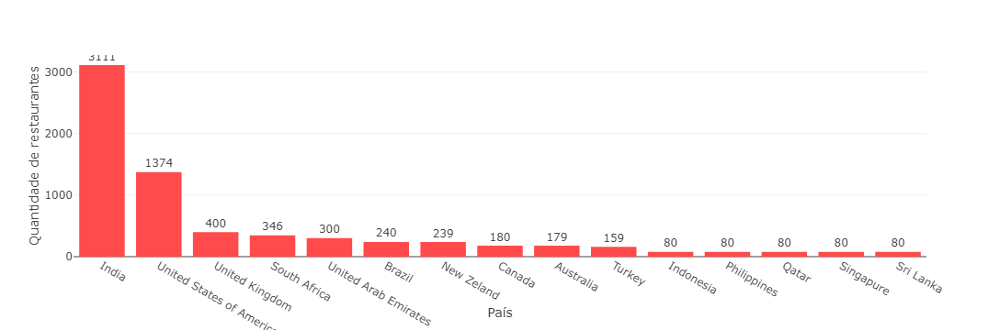

In [21]:
# Encontrar o número de restaurantes registrados por país.

df_aux = (df.loc[:, ['country', 'restaurant_id']].groupby('country')
                                                  .count()
                                                  .sort_values('restaurant_id', ascending=False)
                                                  .reset_index())



fig = px.bar(df_aux, x='country', y='restaurant_id', text='restaurant_id', category_orders={'restaurant_id': df_aux['restaurant_id']}, 
       labels={'country' : 'País', 'restaurant_id': 'Quantidade de restaurantes'})

fig.update_traces(marker_color='#ff4b4b', textposition='outside')
fig.update_layout(height=550)

### 3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?

In [22]:
# Encontrar o número de restaurantes com o nível de preço 4 registrados por país.

df_aux = df.loc[df['price_range'] == 4, ['country', 'restaurant_id']].groupby('country').count().reset_index()

df_aux.sort_values('restaurant_id', ascending=False)

,country,restaurant_id
14,United States of America,415
9,South Africa,221
3,India,195
1,Brazil,148
12,United Arab Emirates,102
5,New Zeland,79
13,United Kingdom,79
11,Turkey,59
8,Singapure,58
2,Canada,54


### 4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?

In [23]:
# Encontrar o número de tipos de culinária únicos por país.

df_aux = df.loc[:, ['country', 'cuisines']].groupby('country').nunique().reset_index()

df_aux.sort_values('cuisines', ascending=False)

,country,cuisines
3,India,77
14,United States of America,74
13,United Kingdom,52
12,United Arab Emirates,46
0,Australia,43
1,Brazil,43
2,Canada,42
9,South Africa,42
5,New Zeland,37
7,Qatar,31


### 5. Qual o nome do país que possui a maior quantidade de avaliações feitas?

In [24]:
# Encontrar a quantidade de avaliações por país.

df_aux = df.loc[:, ['country', 'votes']].groupby('country').sum().reset_index()

df_aux.sort_values('country', ascending=False)

,country,votes
14,United States of America,522348
13,United Kingdom,39956
12,United Arab Emirates,177564
11,Turkey,100193
10,Sri Lanka,12133
9,South Africa,81939
8,Singapure,1822
7,Qatar,30106
6,Philippines,48398
5,New Zeland,52532


### 6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?

In [25]:
# Encontrar a quantidade de restaurantes que fazem entrega por país.
# 0 - Yes, 1 - No

df_aux = df.loc[df['is_delivering_now'] == 0, ['country', 'is_delivering_now']].groupby('country').count().reset_index()

df_aux.sort_values('is_delivering_now', ascending=False)

,country,is_delivering_now
3,India,1961
14,United States of America,1374
13,United Kingdom,400
9,South Africa,346
12,United Arab Emirates,248
1,Brazil,240
5,New Zeland,239
2,Canada,180
0,Australia,179
11,Turkey,159


### 7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?

In [26]:
# Encontrar o número de restaurantes que aceitam reservas por país.
# 0 - Yes, 1 - No

df_aux = df.loc[df['has_table_booking'] == 0, ['country', 'has_table_booking']].groupby('country').count().reset_index()

df_aux.sort_values('has_table_booking', ascending=False)

,country,has_table_booking
3,India,2855
14,United States of America,1371
13,United Kingdom,345
9,South Africa,343
12,United Arab Emirates,290
1,Brazil,240
5,New Zeland,220
2,Canada,180
11,Turkey,155
0,Australia,151


### 8. Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?

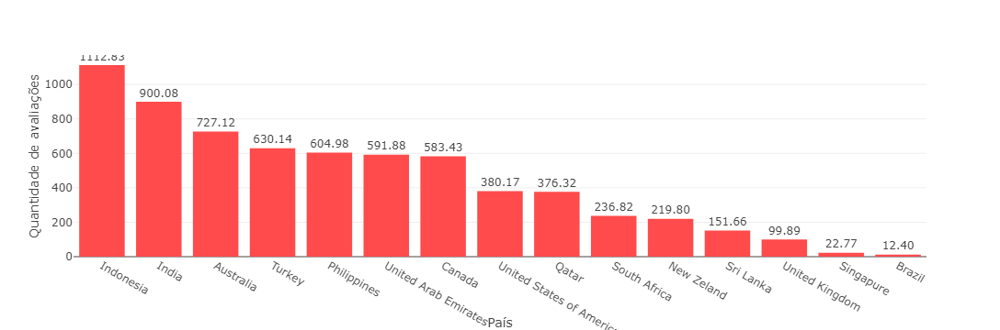

In [27]:
# Encontrar a quantidade média de avaliações por país.

df_aux = (df.loc[:, ['votes', 'country']].groupby('country')
                                          .mean()
                                          .sort_values('votes', ascending=False)
                                          .reset_index())

fig = px.bar(df_aux, x='country', y='votes', text='votes', text_auto='.2f', category_orders={'votes': df_aux['votes']}, 
       labels={'country': 'País',
        'votes': 'Quantidade de avaliações'})

fig.update_traces(marker_color='#ff4b4b', textposition='outside')
fig.update_layout(height=550)

### 9. Qual o nome do país que possui, na média, a maior nota média registrada?

In [28]:
# Encontrar a nota média regisrada por país.

df_aux = df.loc[:, ['aggregate_rating', 'country']].groupby('country').mean().reset_index()

df_aux.sort_values('aggregate_rating', ascending=False)

,country,aggregate_rating
4,Indonesia,4.601250
6,Philippines,4.463750
8,Singapure,4.435000
14,United States of America,4.402693
0,Australia,4.370950
2,Canada,4.321667
11,Turkey,4.310063
7,Qatar,4.240000
5,New Zeland,4.164435
9,South Africa,4.061561


### 10. Qual o nome do país que possui, na média, a menor nota média registrada?

In [29]:
# Encontrar a nota média regisrada por país.

df_aux = df.loc[:, ['aggregate_rating', 'country']].groupby('country').mean().reset_index()

df_aux.sort_values('aggregate_rating', ascending=True)

,country,aggregate_rating
1,Brazil,3.321667
12,United Arab Emirates,4.023667
3,India,4.037126
13,United Kingdom,4.041750
10,Sri Lanka,4.057500
9,South Africa,4.061561
5,New Zeland,4.164435
7,Qatar,4.240000
11,Turkey,4.310063
2,Canada,4.321667


### 11. Qual a média de preço de um prato para dois por país?

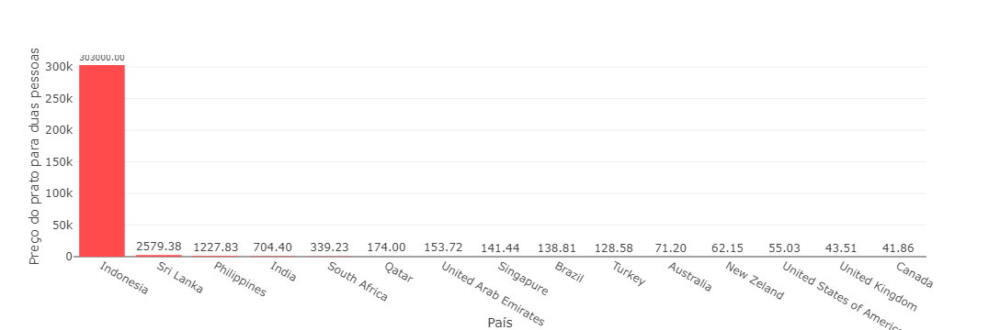

In [30]:
df_aux = (df.loc[:, ['country', 'average_cost_for_two']].groupby('country')
                                                         .mean()
                                                         .sort_values('average_cost_for_two', ascending=False)
                                                         .reset_index())

fig = px.bar(df_aux, x='country', y='average_cost_for_two', text='average_cost_for_two', text_auto='.2f',
       category_orders={'average_cost_for_two': df_aux['average_cost_for_two']}, 
       labels={'country': 'País',
        'average_cost_for_two': 'Preço do prato para duas pessoas'})

fig.update_traces(marker_color='#ff4b4b', textposition='outside')
fig.update_layout(height=550)

## Visão Cidade

#### 1. Qual o nome da cidade que possui mais restaurantes registrados?

In [31]:
# Encontrar o número de restaurantes registrados por cidade.

df_aux = (df.loc[:, ['country','city', 'restaurant_id']].groupby(['country','city'])
                                                         .count()
                                                         .sort_values(['restaurant_id', 'city'], ascending=[False, True])
                                                         .reset_index())

color_country = {'India': '#ff4b4b',
'United Kingdom': '#e19990',
'United States of America': '#798897',
'Indonesia': '#8bade1',
'New Zeland': '#39608f',
'Turkey': '#57423f',
'Brazil': '#79aef3',
'Australia': '#ffe5de',
'Philippines': '#639d00',
'Canada': '#2a6900',
'Singapure': '#6B5695',
'United Arab Emirates': '#0095ff',
'Qatar': '#9c70ff',
'Sri Lanka': '#ff95bc',
'South Africa': '#f55b00'}

fig = px.bar(df_aux.head(10), x='city', y ='restaurant_id', color='country', text='restaurant_id', 
       labels={'city': 'Cidade',
        'restaurant_id': 'Quantidade de restaurantes',
        'country': 'País'}, category_orders={'city': df_aux['city']}, color_discrete_map=color_country)
fig.update_traces(textposition='outside')
fig.update_layout(height=550)

### 2. Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?

In [32]:
# Encontrar o número de restaurantes com nota média acima de 4 por cidade.

df_aux = (df.loc[df['aggregate_rating'] > 4, ['aggregate_rating', 'city', 'country']]
             .groupby(['country', 'city'])
             .count()
             .sort_values(['aggregate_rating', 'city'], ascending=[False, True])
             .reset_index())

color_country = {'India': '#ff4b4b',
'United Kingdom': '#e19990',
'United States of America': '#798897',
'Indonesia': '#8bade1',
'New Zeland': '#39608f',
'Turkey': '#57423f',
'Brazil': '#79aef3',
'Australia': '#ffe5de',
'Philippines': '#639d00',
'Canada': '#2a6900',
'Singapure': '#6B5695',
'United Arab Emirates': '#0095ff',
'Qatar': '#9c70ff',
'Sri Lanka': '#ff95bc',
'South Africa': '#f55b00'}

fig = px.bar(df_aux.head(10), x='city', y='aggregate_rating', color='country', text='aggregate_rating', 
       labels={'city': 'Cidade',
                'aggregate_rating': 'Quantidade de restaurantes',
                'country': 'País'}, category_orders={'city': df_aux['city']}, color_discrete_map=color_country)

fig.update_traces(textposition='outside')
fig.update_layout(height=550)

### 3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?

In [33]:
# Encontrar o número de restaurantes com nota média abaixo de 2.5 por cidade.

df_aux = (df.loc[df['aggregate_rating'] < 2.5, ['aggregate_rating', 'city', 'country']]
             .groupby(['country', 'city'])
             .count()
             .sort_values(['aggregate_rating', 'city'], ascending=[False, True]) 
             .reset_index())

color_country = {'India': '#ff4b4b',
'United Kingdom': '#e19990',
'United States of America': '#798897',
'Indonesia': '#8bade1',
'New Zeland': '#39608f',
'Turkey': '#57423f',
'Brazil': '#79aef3',
'Australia': '#ffe5de',
'Philippines': '#639d00',
'Canada': '#2a6900',
'Singapure': '#6B5695',
'United Arab Emirates': '#0095ff',
'Qatar': '#9c70ff',
'Sri Lanka': '#ff95bc',
'South Africa': '#f55b00'}

fig = px.bar(df_aux.head(10), x='city', y='aggregate_rating', color='country', text='aggregate_rating', 
       labels={'city': 'Cidade',
        'aggregate_rating': 'Quantidade de restaurantes',
        'country': 'País'}, category_orders={'city': df_aux['city']}, color_discrete_map=color_country)

fig.update_traces(textposition='outside')
fig.update_layout(height=550)

### 4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?

In [34]:
# Encontrar o valor médio de um prato para dois por cidade.

df_aux = df.loc[:, ['city', 'average_cost_for_two']].groupby('city').mean().reset_index()

df_aux.sort_values('average_cost_for_two', ascending=False)

,city,average_cost_for_two
51,Jakarta,309605.263158
115,Tangerang,180000.000000
15,Bogor,175000.000000
86,Pasay City,4000.000000
27,Colombo,2579.375000
...,...,...
19,Calgary,32.500000
60,Los Angeles,30.000000
30,Denver,29.916667
91,Phoenix,28.000000


### 5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintos?

In [35]:
# Encontrar a quantidade de tipos únicos de culinária por cidade.

df_aux = (df.loc[:, ['city', 'cuisines', 'country']]
             .groupby(['country', 'city'])
             .nunique()
             .sort_values(['cuisines', 'city'], ascending=[False, True])
             .reset_index())

color_country = {'India': '#ff4b4b',
'United Kingdom': '#e19990',
'United States of America': '#798897',
'Indonesia': '#8bade1',
'New Zeland': '#39608f',
'Turkey': '#57423f',
'Brazil': '#79aef3',
'Australia': '#ffe5de',
'Philippines': '#639d00',
'Canada': '#2a6900',
'Singapure': '#6B5695',
'United Arab Emirates': '#0095ff',
'Qatar': '#9c70ff',
'Sri Lanka': '#ff95bc',
'South Africa': '#f55b00'}

fig = px.bar(df_aux.head(10), x='city', y='cuisines', color='country', text='cuisines', 
       labels={'city': 'Cidade',
        'cuisines': 'Quantidade de tipos culinários únicos',
        'country': 'País'},  category_orders={'city': df_aux['city']}, color_discrete_map=color_country)

fig.update_traces(textposition='outside')
fig.update_layout(height=550)

### 6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?

In [36]:
# Encontrar a quantidade de restaurantes que fazem reserva por cidade.
# 0 - Yes, 1 - No

df_aux = df.loc[df['has_table_booking'] == 0, ['has_table_booking', 'city']].groupby('city').count().reset_index()

df_aux.sort_values('has_table_booking', ascending=False)

,city,has_table_booking
17,Brasília,80
10,Austin,80
82,Ooty,80
20,Cape Town,80
98,Rio de Janeiro,80
...,...,...
99,Roodepoort,1
15,Bogor,1
73,Muntinlupa City,1
103,San Juan City,1


### 7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?

In [37]:
# Encontrar o número de restaurantes que fazem entrega por cidade.
# 0 - Yes, 1 - No

df_aux = df.loc[df['is_delivering_now'] == 0, ['is_delivering_now', 'city']].groupby('city').count().reset_index()

df_aux.sort_values('is_delivering_now', ascending=False)

,city,is_delivering_now
10,Austin,80
27,Colombo,80
28,Dallas,80
97,Rio de Janeiro,80
17,Brasília,80
...,...,...
102,San Juan City,1
39,Ghaziabad,1
98,Roodepoort,1
121,Zirakpur,1


### 8. Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

In [38]:
# Encontrar o número de restaurantes que aceitam pedidos online por cidade.
# 1 - Yes, 0 - No

df_aux = df.loc[df['has_online_delivery'] == 1, ['has_online_delivery', 'city']].groupby('city').count().reset_index()

df_aux.sort_values('has_online_delivery', ascending=False)

,city,has_online_delivery
7,Bhopal,75
49,Vadodara,74
0,Abu Dhabi,71
45,Sharjah,71
33,Nagpur,69
5,Aurangabad,69
40,Patna,69
43,Ranchi,69
11,Coimbatore,68
3,Allahabad,68


## Visão Restaurante

### 1. Qual o nome do restaurante que possui a maior quantidade de avaliações?

In [39]:
# Encontrar a quantidade de avaliações por restaurante.
# Caso existam restaurantes com o mesmo número de avaliações, o critério de desempate é o restaurante mais antigo (ou seja, com o menor id).

(df.loc[:, ['restaurant_id', 'restaurant_name', 'votes']].sort_values(['votes', 'restaurant_id'], ascending=[False, True])).iloc[0,1]

'Bawarchi'

### 2. Qual o nome do restaurante com a maior nota média?

In [40]:
# Encontrar a nota média por restaurante.
# Caso existam restaurantes com a mesma nota média, o critério de desempate é o restaurante mais antigo (ou seja, com o menor id).

(df.loc[:, ['restaurant_id', 'restaurant_name', 'aggregate_rating']]
   .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])).iloc[0,1]

'Indian Grill Room'

### 3. Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?

In [41]:
# Critério de desempate -> restaurante mais antigo.

(df.loc[:, ['restaurant_id', 'restaurant_name', 'average_cost_for_two']]
   .sort_values(['average_cost_for_two', 'restaurant_id'], ascending=[False, True])).iloc[0,1]

'The Café - Hotel Mulia'

### 4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?

In [42]:
(df.loc[df['cuisines'] == 'Brazilian', ['restaurant_id', 'restaurant_name', 'aggregate_rating']]
   .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[True, True])).iloc[0,1]

'Loca Como tu Madre'

### 5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?

In [43]:
(df.loc[(df['cuisines'] == 'Brazilian') & (df['country'] == 'Brazil'), ['restaurant_id', 'restaurant_name', 'aggregate_rating']]
   .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])).iloc[0,1]

'Braseiro da Gávea'

### 6. Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?

In [44]:
# Encontrar a média de votos por restaurante, agrupando por aceite ou não do pedido online.
# 1 - Yes, 0 - No

df.loc[:, ['has_online_delivery', 'votes']].groupby('has_online_delivery').mean().reset_index()

# A hipótese é verdadeira - os restaurantes que aceitam pedido online são, na média, os que mais possuem avaliações registradas.

,has_online_delivery,votes
0,0,479.482444
1,1,838.821664


### 7. Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?

In [45]:
# Encontrar a média do valor do prato para duas pessoas, agrupado por aceite ou não de reserva.
# 0 - Yes, 1 - No

df.loc[:, ['has_table_booking', 'average_cost_for_two']].groupby('has_table_booking').mean().reset_index()

# A hipótese é falsa - os restaurantes que fazem reserva tem o valor do prato para duas pessoas, na média, menor.

,has_table_booking,average_cost_for_two
0,0,3488.596866
1,1,10499.572792


### 8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

In [46]:
# Filtrar por restaurantes de culinária japonesa nos EUA e restaurantes de BBQ nos EUA. Agrupar por tipo de culinária. 
# Calcular a média do custo do prato para duas pessoas.

linhas = ((df['cuisines'] == 'Japanese') | (df['cuisines'] == 'BBQ')) & (df['country'] == 'United States of America') 

df.loc[linhas, ['cuisines', 'average_cost_for_two']].groupby('cuisines').mean().reset_index()

# A hipótese é falsa - a média de custo do prato para duas pessoas nos restaurantes de culinária japonesa nos EUA é 1.4 
# vezes maior que as churrascarias nos EUA.

,cuisines,average_cost_for_two
0,BBQ,39.642857
1,Japanese,56.406250


## Visão Tipo de Culinária

### 1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?

In [47]:
(df.loc[df['cuisines'] == 'Italian', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                      'country', 'average_cost_for_two','votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])
  .reset_index(drop=True).iloc[0,1])
  

'Darshan'

### 2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?

In [48]:
(df.loc[df['cuisines'] == 'Italian', ['restaurant_id', 'restaurant_name', 'aggregate_rating','cuisines', 'city',
                                      'country', 'average_cost_for_two','votes']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[True, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Avenida Paulista'

### 3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?

In [49]:
(df.loc[df['cuisines'] == 'American', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                       'country', 'average_cost_for_two', 'votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Burger & Lobster'

### 4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?

In [50]:
(df.loc[df['cuisines'] == 'American', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                       'country', 'average_cost_for_two','votes']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[True, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Alston Bar & Beef'

### 5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?

In [51]:
(df.loc[df['cuisines'] == 'Arabian', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                      'country', 'average_cost_for_two','votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Mandi@36'

### 6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?

In [52]:
(df.loc[df['cuisines'] == 'Arabian', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                      'country', 'average_cost_for_two', 'votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[True, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Raful'

### 7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?

In [53]:
(df.loc[df['cuisines'] == 'Japanese', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                       'country', 'average_cost_for_two', 'votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Sushi Samba'

### 8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?

In [54]:
(df.loc[df['cuisines'] == 'Japanese', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                       'country', 'average_cost_for_two','votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[True, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Banzai Sushi'

### 9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?

In [55]:
(df.loc[df['cuisines'] == 'Home-made', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                        'country', 'average_cost_for_two','votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[False, True])
  .reset_index(drop=True)
  .iloc[0,1])

'Kanaat Lokantası'

### 10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?

In [56]:
(df.loc[df['cuisines'] == 'Home-made', ['restaurant_id', 'restaurant_name', 'aggregate_rating', 'cuisines', 'city', 
                                        'country', 'average_cost_for_two','votes', 'currency']]
  .sort_values(['aggregate_rating', 'restaurant_id'], ascending=[True, True])
  .reset_index(drop=True)
  .iloc[0,1])

'GurMekan Restaurant'

### 11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?

In [57]:
(df.loc[:, ['cuisines', 'average_cost_for_two']]
   .sort_values('average_cost_for_two', ascending=False)).iloc[0,0]

'Asian'

In [58]:
# Outra maneira:

(df.loc[:, ['cuisines', 'average_cost_for_two']].groupby('cuisines')
   .max().sort_values('average_cost_for_two', ascending=False).reset_index()).iloc[0,0]

'Asian'

### 12. Qual o tipo de culinária que possui a maior nota média?

In [59]:
(df.loc[:, ['cuisines', 'aggregate_rating']]
   .groupby('cuisines')
   .mean('aggregate_rating')
   .sort_values('aggregate_rating', ascending=False)
   .reset_index()).iloc[0,0]

'Others'

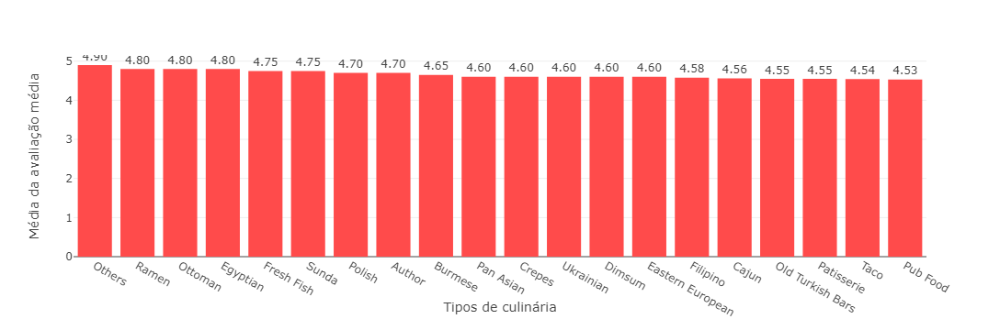

In [60]:
df_aux = (df.loc[:, ['cuisines', 'aggregate_rating']]
            .groupby('cuisines')
            .mean('aggregate_rating')
            .sort_values('aggregate_rating', ascending=False)
            .reset_index())

fig = px.bar(df_aux.head(20), x='cuisines', y='aggregate_rating', text='aggregate_rating', text_auto='.2f' , 
      labels={'cuisines': 'Tipos de culinária',
        'aggregate_rating': 'Média da avaliação média'})

fig.update_traces(marker_color='#ff4b4b', textposition='outside')
fig.update_layout(height=550)

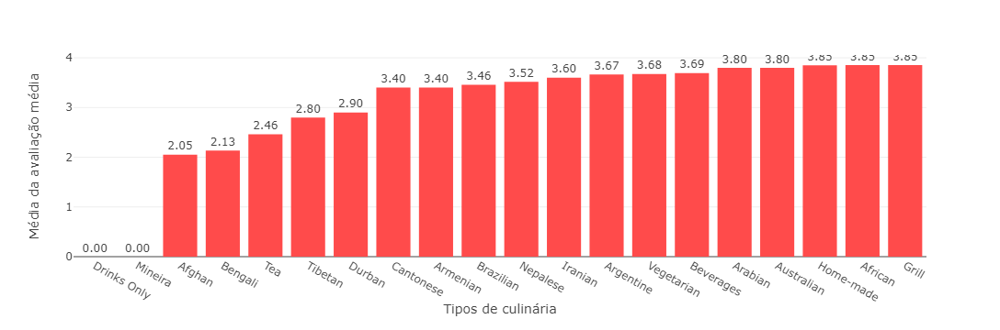

In [61]:
# Tipos de culinária com a menor nota média:

df_aux = (df.loc[:, ['cuisines', 'aggregate_rating']]
            .groupby('cuisines')
            .mean('aggregate_rating')
            .sort_values('aggregate_rating', ascending=True)
            .reset_index())

fig = px.bar(df_aux.head(20), x='cuisines', y='aggregate_rating', text='aggregate_rating', text_auto='.2f' , 
      labels={'cuisines': 'Tipos de culinária',
        'aggregate_rating': 'Média da avaliação média'})


fig.update_traces(marker_color='#ff4b4b', textposition='outside')
fig.update_layout(height=550)

### 13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

In [62]:
# Filtrar pelos restaurantes que aceitam pedidos online e que fazem entrega. Agrupar por tipo de culinária e contar quantos restaurantes tem em cada culinária.
# Has Online delivery: 1 - Yes, 0 - No
# Is delivering now: 0 - yes/ 1 - no

linhas = ( df['has_online_delivery'] == 1 ) & ( df['is_delivering_now'] == 0 )

(df.loc[linhas, ['restaurant_id', 'cuisines']].groupby('cuisines').count().sort_values('restaurant_id', ascending=False).reset_index()).iloc[0,0]

'North Indian'